<a href="https://colab.research.google.com/github/Mariyaben/Digital-Image-and-Video-Processing-Lab/blob/main/DIP_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

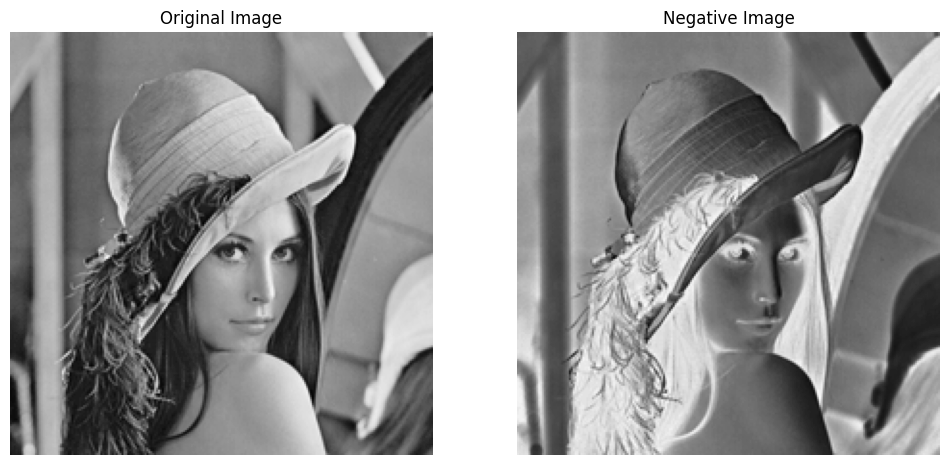

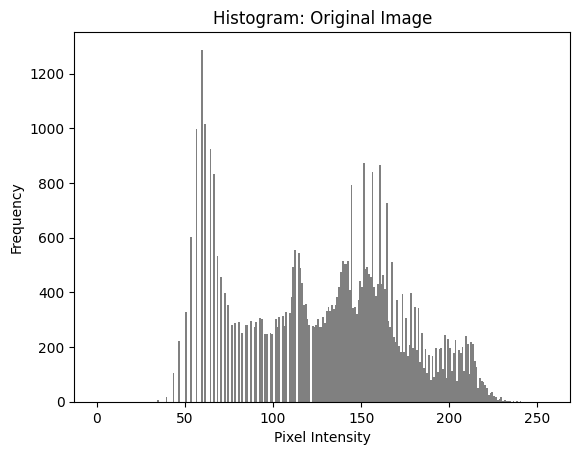

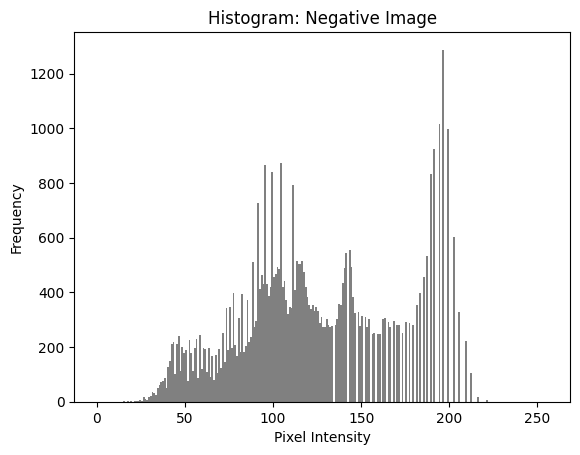


Analysis:
1. The negative image flips the pixel intensity values, such that bright regions become dark and vice versa.
2. The histogram of the negative image is a mirrored version of the original image's histogram about the center (pixel intensity 127.5).


In [2]:
#Image Negative
import cv2
import numpy as np
import matplotlib.pyplot as plt

def image_negative(image):
    return 255 - image

# Session 1: Loading and transforming the image
def load_and_transform_image(image_path):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if original_image is None:
        raise ValueError("Error: Could not load the image. Make sure the file path is correct.")

    negative_image = image_negative(original_image)

    return original_image, negative_image

# Session 2: Displaying the images
def display_images(original_image, negative_image):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Negative Image")
    plt.imshow(negative_image, cmap='gray')
    plt.axis('off')

    plt.show()

# Session 3: Plotting histograms and analysis
def plot_and_analyze_histograms(original_image, negative_image):
    plot_histogram(original_image, "Histogram: Original Image")
    plot_histogram(negative_image, "Histogram: Negative Image")

    print("\nAnalysis:")
    print("1. The negative image flips the pixel intensity values, such that bright regions become dark and vice versa.")
    print("2. The histogram of the negative image is a mirrored version of the original image's histogram about the center (pixel intensity 127.5).")

def plot_histogram(image, title):
    plt.figure()
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.hist(image.ravel(), bins=256, range=(0, 256), color='gray')
    plt.show()

def main():
    image_path = "/content/Lenna_(test_image).png"

    try:
        original_image, negative_image = load_and_transform_image(image_path)
        display_images(original_image, negative_image)
        plot_and_analyze_histograms(original_image, negative_image)
    except ValueError as e:
        print(e)

if __name__ == "__main__":
    main()


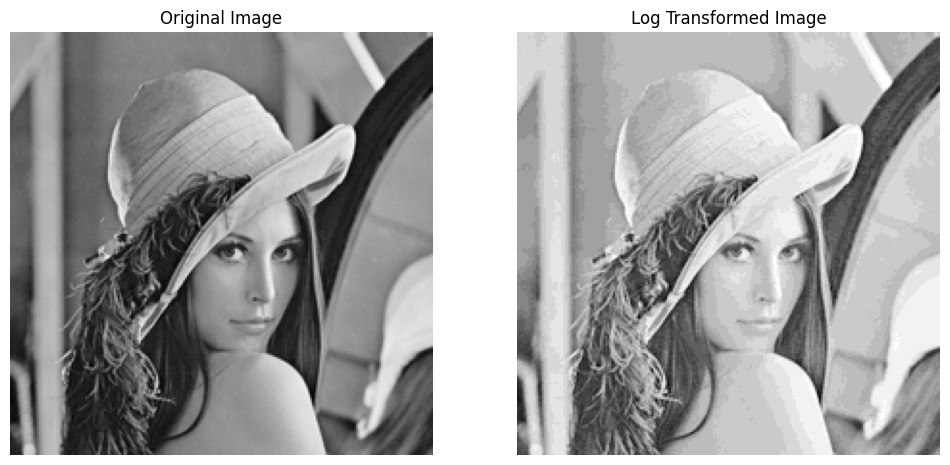

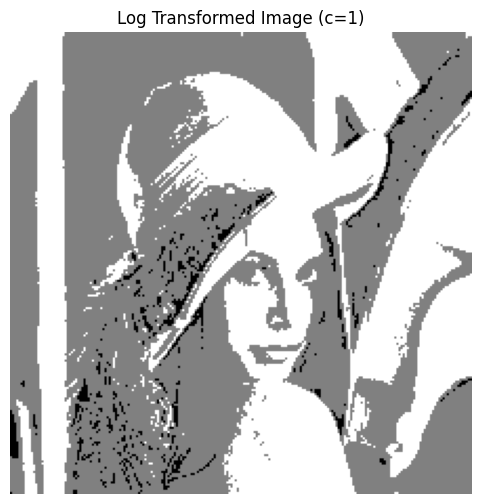

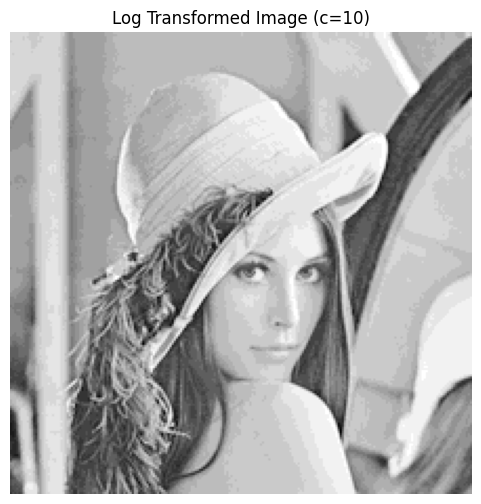

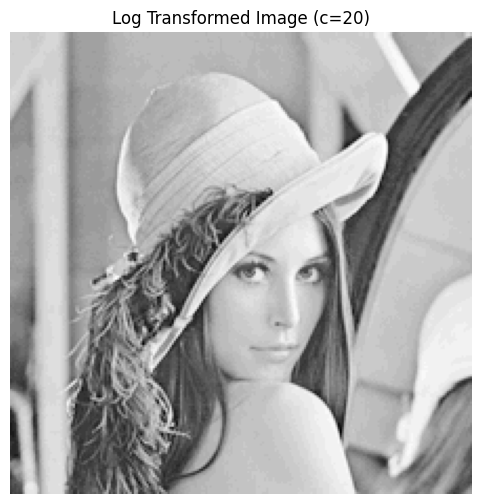

In [5]:
#Log Transformation
import cv2
import numpy as np
import matplotlib.pyplot as plt

def log_transform(image, c):
    return (c * np.log1p(image)).astype(np.uint8)

def load_and_apply_log_transform(image_path, c):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if original_image is None:
        raise ValueError("Error: Could not load the image. Make sure the file path is correct.")
    log_image = log_transform(original_image, c)
    return original_image, log_image

def display_images(original_image, log_image, save_path=None):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(original_image, cmap='gray')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title("Log Transformed Image")
    plt.imshow(log_image, cmap='gray')
    plt.axis('off')
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

def experiment_with_constants(original_image, constants):
    for c in constants:
        log_image = log_transform(original_image, c)
        plt.figure(figsize=(6, 6))
        plt.title(f"Log Transformed Image (c={c})")
        plt.imshow(log_image, cmap='gray')
        plt.axis('off')
        plt.show()

def main():
    image_path = "/content/Lenna_(test_image).png"
    constants = [1, 10, 20]
    try:
        original_image, log_image = load_and_apply_log_transform(image_path, constants[1])
        display_images(original_image, log_image, save_path="log_transform_output.png")
        experiment_with_constants(original_image, constants)
    except ValueError as e:
        print(e)

if __name__ == "__main__":
    main()


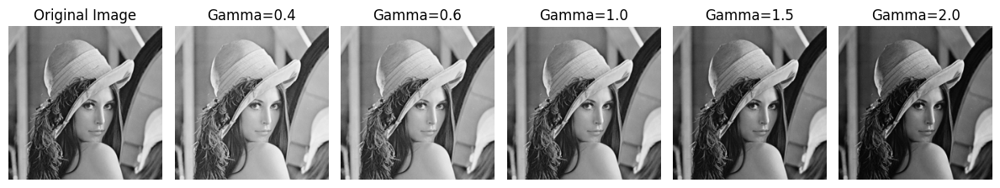

In [6]:
#Power-Law Transformation
import cv2
import numpy as np
import matplotlib.pyplot as plt

def power_law_transform(image, gamma, c=1):
    normalized_image = image / 255.0
    transformed_image = c * (normalized_image ** gamma)
    return (transformed_image * 255).astype(np.uint8)

def load_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(f"Error: Could not load the image from {image_path}.")
    return image

def apply_power_law_transform(image, gamma, c=1):
    return power_law_transform(image, gamma, c)

def display_images(images, titles, save_path=None):
    plt.figure(figsize=(12, 6))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        plt.title(title)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

def experiment_with_gamma(image, gamma_values):
    results = []
    for gamma in gamma_values:
        transformed_image = apply_power_law_transform(image, gamma)
        results.append((transformed_image, f"Gamma={gamma}"))
    return results

def main():
    image_path = "Lenna_(test_image).png"
    gamma_values = [0.4, 0.6, 1.0, 1.5, 2.0]

    try:
        original_image = load_image(image_path)

        gamma_results = experiment_with_gamma(original_image, gamma_values)
        images = [original_image] + [img for img, _ in gamma_results]
        titles = ["Original Image"] + [title for _, title in gamma_results]

        display_images(images, titles, save_path="power_law_transform_output.png")
    except (FileNotFoundError, ValueError) as e:
        print(e)

if __name__ == "__main__":
    main()


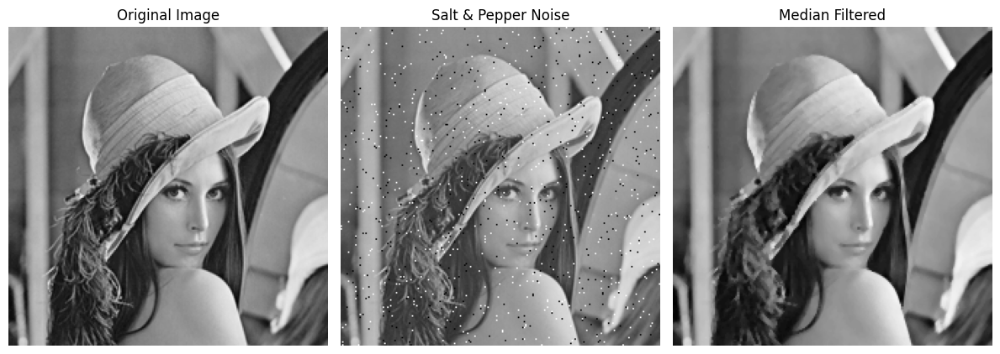

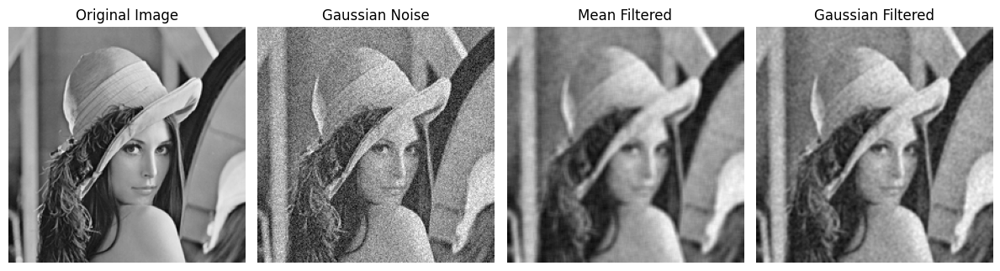

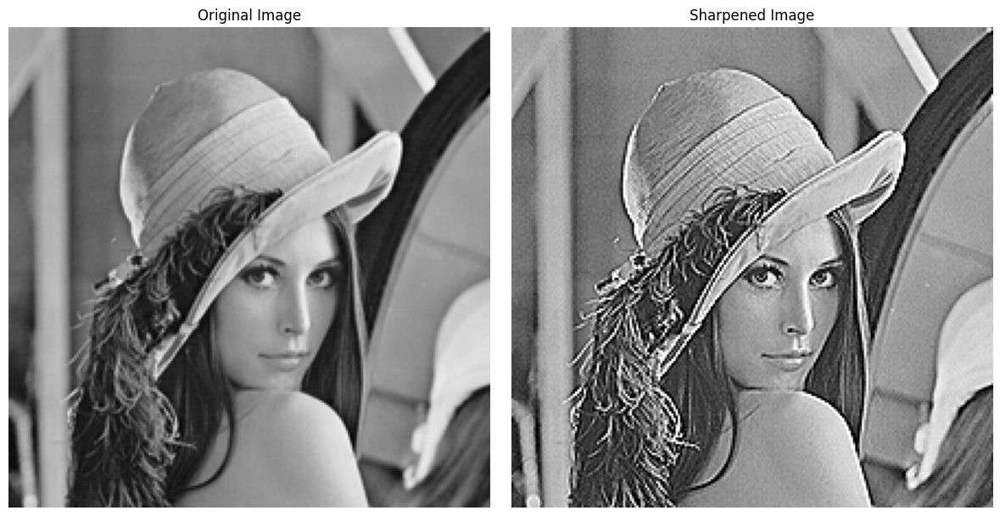

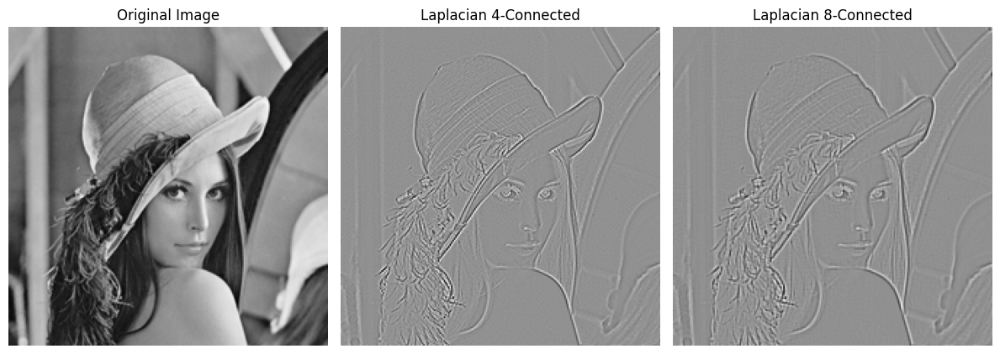

In [7]:
#Spatial Filtering
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter, gaussian_filter

def load_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(f"Error: Could not load the image from {image_path}.")
    return image

def add_noise(image, noise_type):
    noisy_image = image.copy()
    if noise_type == "salt_and_pepper":
        prob = 0.02
        rnd = np.random.rand(*image.shape)
        noisy_image[rnd < prob / 2] = 0
        noisy_image[rnd > 1 - prob / 2] = 255
    elif noise_type == "gaussian":
        mean = 0
        sigma = 20
        gaussian_noise = np.random.normal(mean, sigma, image.shape)
        noisy_image = np.clip(image + gaussian_noise, 0, 255).astype(np.uint8)
    return noisy_image

def mean_filter(image, kernel_size):
    return cv2.blur(image, (kernel_size, kernel_size))

def apply_median_filter(image, kernel_size):
    return median_filter(image, size=kernel_size)

def apply_gaussian_filter(image, sigma):
    return gaussian_filter(image, sigma=sigma)

def custom_sharpening_filter(image):
    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def laplacian_edge_detection(image, connectivity=4):
    if connectivity == 4:
        return cv2.Laplacian(image, cv2.CV_64F, ksize=1)
    elif connectivity == 8:
        return cv2.Laplacian(image, cv2.CV_64F, ksize=3)

def display_images(images, titles, save_path=None):
    plt.figure(figsize=(12, 6))
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        plt.title(title)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

def main():
    image_path = "Lenna_(test_image).png"
    try:
        original_image = load_image(image_path)

        salt_pepper_noisy = add_noise(original_image, "salt_and_pepper")
        gaussian_noisy = add_noise(original_image, "gaussian")

        mean_filtered = mean_filter(gaussian_noisy, 5)
        median_filtered = apply_median_filter(salt_pepper_noisy, 3)
        gaussian_filtered = apply_gaussian_filter(gaussian_noisy, 1)

        sharpened_image = custom_sharpening_filter(original_image)

        laplacian_4 = laplacian_edge_detection(original_image, connectivity=4)
        laplacian_8 = laplacian_edge_detection(original_image, connectivity=8)

        display_images(
            [original_image, salt_pepper_noisy, median_filtered],
            ["Original Image", "Salt & Pepper Noise", "Median Filtered"],
            save_path="median_filter_output.png"
        )

        display_images(
            [original_image, gaussian_noisy, mean_filtered, gaussian_filtered],
            ["Original Image", "Gaussian Noise", "Mean Filtered", "Gaussian Filtered"],
            save_path="gaussian_mean_filter_output.png"
        )

        display_images(
            [original_image, sharpened_image],
            ["Original Image", "Sharpened Image"],
            save_path="sharpened_image_output.png"
        )

        display_images(
            [original_image, laplacian_4, laplacian_8],
            ["Original Image", "Laplacian 4-Connected", "Laplacian 8-Connected"],
            save_path="laplacian_edge_output.png"
        )

    except (FileNotFoundError, ValueError) as e:
        print(e)

if __name__ == "__main__":
    main()


Image Subtraction


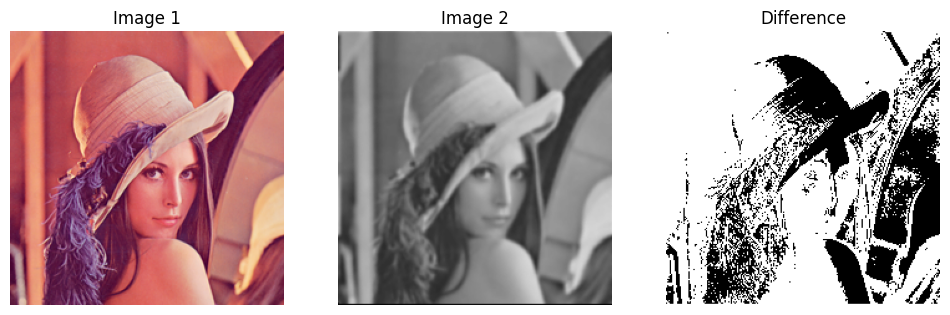

Watermarking


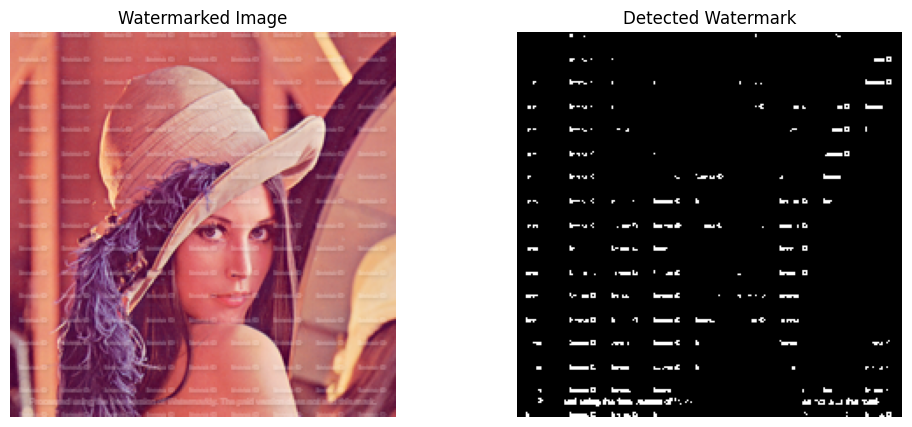

Image Averaging


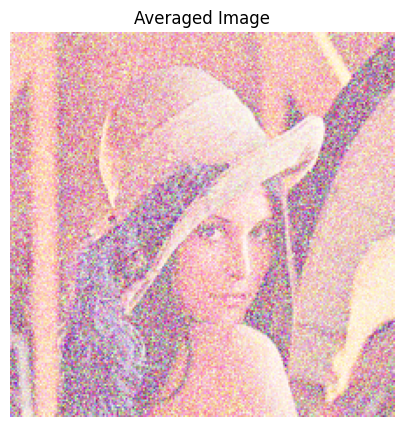

In [14]:
#Image Enhancement: Arithmetic/Logic Operations
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_watermark(image, watermark, alpha=0.5):
    watermark = cv2.resize(watermark, (image.shape[1], image.shape[0]))
    resultant = cv2.addWeighted(image, 1 - alpha, watermark, alpha, 0)
    return resultant

def average_images(imageList):
    size = imageList[0].shape
    average = np.zeros(size, dtype=np.float32)
    for img in imageList:
        average += img / len(imageList)
    return np.uint8(average)

image1 = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_COLOR)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.imread("lenna_altered.png", cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Ensure both images have the same size
if image1.shape != image2.shape:
    image2 = cv2.resize(image2, (image1.shape[1], image1.shape[0]))

# Image Subtraction
print("Image Subtraction")
difference = cv2.absdiff(image1, image2)
_, thresh_diff = cv2.threshold(cv2.cvtColor(difference, cv2.COLOR_RGB2GRAY), 30, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.title("Image 1")
plt.imshow(image1)
plt.axis("off")
plt.subplot(1, 3, 2)
plt.title("Image 2")
plt.imshow(image2)
plt.axis("off")
plt.subplot(1, 3, 3)
plt.title("Difference")
plt.imshow(thresh_diff, cmap="gray")
plt.axis("off")
plt.show()

# Watermarking
print("Watermarking")
watermark = cv2.imread("/content/Lenna_(test_image) (1).png", cv2.IMREAD_COLOR)
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2RGB)
watermarked_image = apply_watermark(image1, watermark, alpha=0.3)
detect = cv2.absdiff(watermarked_image, image1)
_, detected_watermark = cv2.threshold(cv2.cvtColor(detect, cv2.COLOR_RGB2GRAY), 30, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title("Watermarked Image")
plt.imshow(watermarked_image)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Detected Watermark")
plt.imshow(detected_watermark, cmap="gray")
plt.axis("off")
plt.show()

# Image Averaging
print("Image Averaging")
noisy_images = []
for i in range(5):
    noise = np.random.normal(0, 25, image1.shape).astype(np.uint8)
    noisy_image = cv2.add(image1, noise)
    noisy_images.append(noisy_image)
averaged_image = average_images(noisy_images)
plt.figure(figsize=(12, 5))
plt.title("Averaged Image")
plt.imshow(averaged_image)
plt.axis("off")
plt.show()


<ipython-input-15-172ca1a65d30>:16: ComplexWarning: Casting complex values to real discards the imaginary part
  z_transform_image[u, v] = np.sum(image * np.exp(-2j * np.pi * (u * rows + v * cols)))


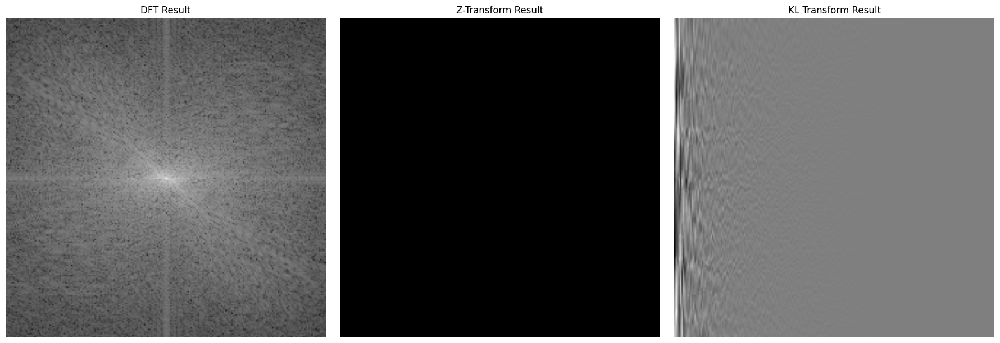

In [15]:
#Image Transform
import cv2
import numpy as np
import matplotlib.pyplot as plt

def discrete_fourier_transform(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
    return magnitude_spectrum

def z_transform(image):
    rows, cols = image.shape
    z_transform_image = np.zeros_like(image, dtype=np.float32)
    for u in range(rows):
        for v in range(cols):
            z_transform_image[u, v] = np.sum(image * np.exp(-2j * np.pi * (u * rows + v * cols)))
    return np.abs(z_transform_image)

def kl_transform(image):
    mean, eigenvectors = cv2.PCACompute(image.astype(np.float32), mean=None)
    transformed = cv2.PCAProject(image.astype(np.float32), mean, eigenvectors)
    return transformed

image = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_GRAYSCALE)
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

dft_result = discrete_fourier_transform(image)
z_transform_result = z_transform(image)
kl_result = kl_transform(image)

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(dft_result, cmap='gray')
plt.title("DFT Result")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(z_transform_result, cmap='gray')
plt.title("Z-Transform Result")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(kl_result, cmap='gray')
plt.title("KL Transform Result")
plt.axis('off')

plt.tight_layout()
plt.savefig("combined_transform_output.png", dpi=300, bbox_inches='tight')
plt.show()


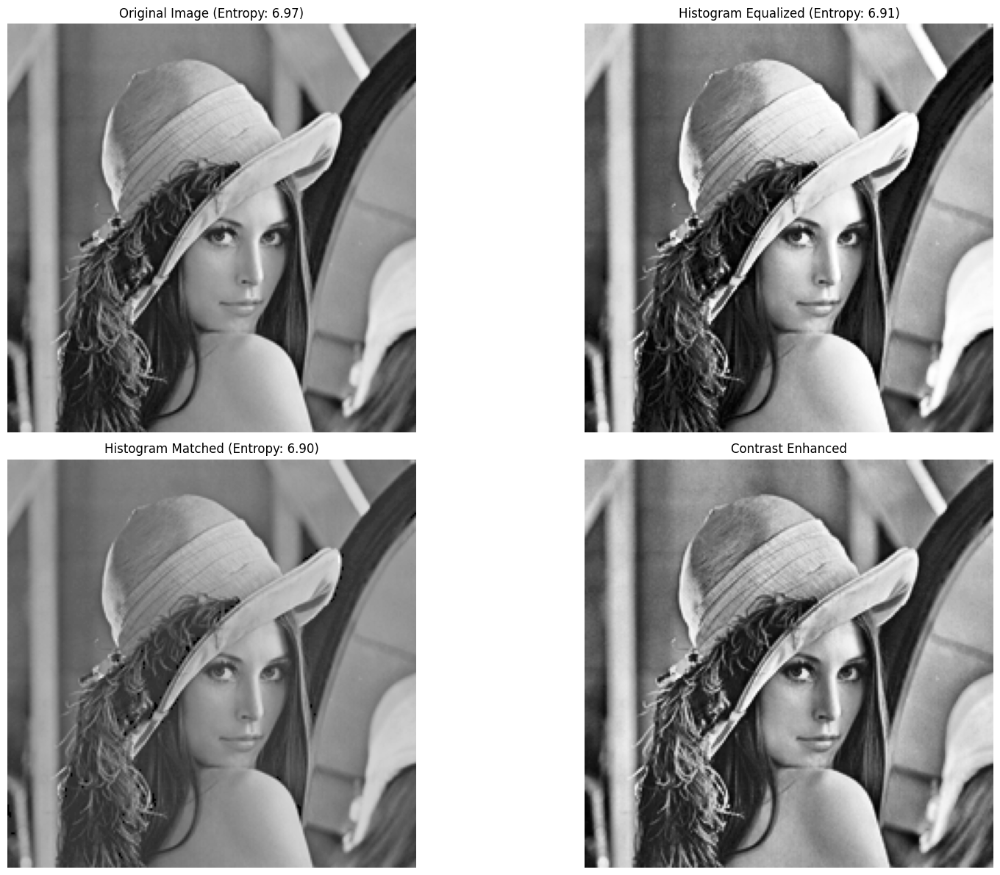

In [18]:
#Intensity Transformation and Histogram Processing
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms
from scipy.stats import entropy

def histogram_equalization(image):
    return cv2.equalizeHist(image)

def histogram_matching(source, reference):
    return match_histograms(source, reference).astype(np.uint8)

def contrast_enhancement(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def calculate_entropy(image):
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256], density=True)
    return entropy(hist, base=2)

image = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_GRAYSCALE)
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

reference_image = cv2.imread("/content/lenna_altered.png", cv2.IMREAD_GRAYSCALE)
if reference_image is None:
    raise FileNotFoundError("Reference image not found. Ensure the path is correct.")

hist_eq_image = histogram_equalization(image)
hist_matched_image = histogram_matching(image, reference_image)
contrast_enhanced_image = contrast_enhancement(image)

entropy_original = calculate_entropy(image)
entropy_hist_eq = calculate_entropy(hist_eq_image)
entropy_hist_matched = calculate_entropy(hist_matched_image)

plt.figure(figsize=(18, 12))
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title(f"Original Image (Entropy: {entropy_original:.2f})")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(hist_eq_image, cmap='gray')
plt.title(f"Histogram Equalized (Entropy: {entropy_hist_eq:.2f})")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(hist_matched_image, cmap='gray')
plt.title(f"Histogram Matched (Entropy: {entropy_hist_matched:.2f})")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(contrast_enhanced_image, cmap='gray')
plt.title("Contrast Enhanced")
plt.axis('off')

plt.tight_layout()
plt.savefig("intensity_transformation_output.png", dpi=300, bbox_inches='tight')
plt.show()

<ipython-input-19-2013c633555e>:46: RuntimeWarning: overflow encountered in exp
  img_homo = np.exp(img_back) - 1


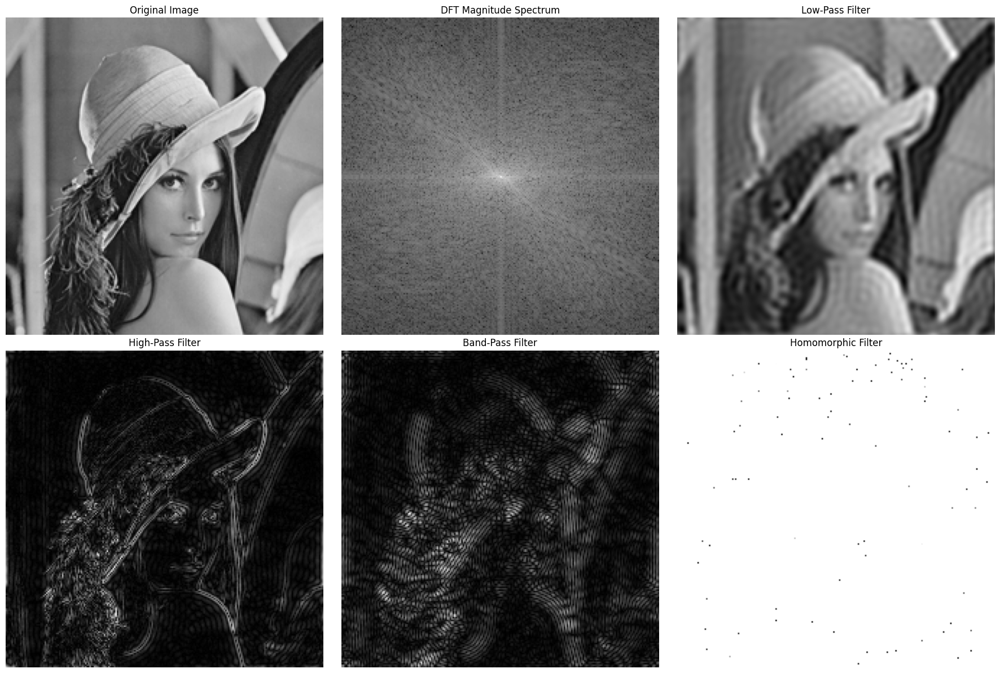

In [19]:
#Frequency Domain Processing
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dft_2d(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)
    return dft, dft_shift, magnitude_spectrum

def idft_2d(dft_shift):
    f_ishift = np.fft.ifftshift(dft_shift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])
    return img_back

def apply_filter(dft_shift, filter_mask):
    return dft_shift * filter_mask

def create_filter(shape, filter_type, cutoff, band_width=0):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.float32)

    for i in range(rows):
        for j in range(cols):
            distance = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
            if filter_type == 'low-pass':
                if distance <= cutoff:
                    mask[i, j] = 1
            elif filter_type == 'high-pass':
                if distance > cutoff:
                    mask[i, j] = 1
            elif filter_type == 'band-pass':
                if cutoff - band_width <= distance <= cutoff + band_width:
                    mask[i, j] = 1
    return mask

def homomorphic_filter(image, low_gain=0.5, high_gain=2.0, cutoff=30):
    rows, cols = image.shape
    image_log = np.log1p(np.float32(image))
    dft, dft_shift, _ = dft_2d(image_log)
    mask = create_filter((rows, cols), 'high-pass', cutoff)
    filtered_dft = apply_filter(dft_shift, mask)
    img_back = idft_2d(filtered_dft)
    img_homo = np.exp(img_back) - 1
    img_homo = np.clip(img_homo, 0, 255).astype(np.uint8)
    return img_homo

image = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_GRAYSCALE)
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

dft, dft_shift, magnitude_spectrum = dft_2d(image)
low_pass_mask = create_filter(image.shape, 'low-pass', 30)
high_pass_mask = create_filter(image.shape, 'high-pass', 30)
band_pass_mask = create_filter(image.shape, 'band-pass', 50, 10)

low_pass_result = idft_2d(apply_filter(dft_shift, low_pass_mask))
high_pass_result = idft_2d(apply_filter(dft_shift, high_pass_mask))
band_pass_result = idft_2d(apply_filter(dft_shift, band_pass_mask))
homomorphic_result = homomorphic_filter(image)

plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title("DFT Magnitude Spectrum")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(low_pass_result, cmap='gray')
plt.title("Low-Pass Filter")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(high_pass_result, cmap='gray')
plt.title("High-Pass Filter")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(band_pass_result, cmap='gray')
plt.title("Band-Pass Filter")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(homomorphic_result, cmap='gray')
plt.title("Homomorphic Filter")
plt.axis('off')

plt.tight_layout()
plt.savefig("frequency_domain_processing_output.png", dpi=300, bbox_inches='tight')
plt.show()


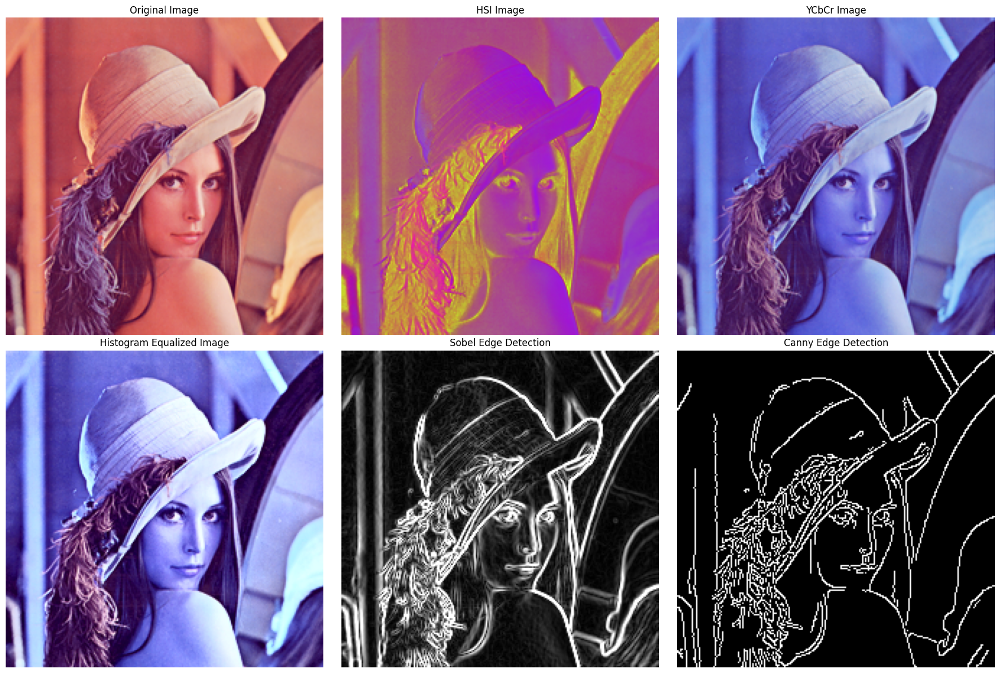

In [20]:
#Color Image Processing
import cv2
import numpy as np
import matplotlib.pyplot as plt

def rgb_to_hsi(image):
    image = np.float32(image) / 255
    r, g, b = cv2.split(image)
    intensity = (r + g + b) / 3
    num = 0.5 * ((r - g) + (r - b))
    den = np.sqrt((r - g) ** 2 + (r - b) * (g - b)) + 1e-10
    theta = np.arccos(num / den)
    hue = np.where(b <= g, theta, 2 * np.pi - theta) / (2 * np.pi)
    saturation = 1 - (3 * np.min([r, g, b], axis=0) / (r + g + b + 1e-10))
    hsi = cv2.merge((hue, saturation, intensity))
    return hsi

def rgb_to_ycbcr(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

def color_histogram_equalization(image):
    ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    y, cb, cr = cv2.split(ycbcr)
    y_eq = cv2.equalizeHist(y)
    ycbcr_eq = cv2.merge((y_eq, cb, cr))
    return cv2.cvtColor(ycbcr_eq, cv2.COLOR_YCrCb2RGB)

def sobel_edge_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient = cv2.magnitude(grad_x, grad_y)
    return np.uint8(np.clip(gradient, 0, 255))

def canny_edge_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    return edges

image = cv2.imread("Lenna_(test_image).png")
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

hsi_image = rgb_to_hsi(image)
ycbcr_image = rgb_to_ycbcr(image)
hist_eq_image = color_histogram_equalization(image)
sobel_edges = sobel_edge_detection(image)
canny_edges = canny_edge_detection(image)

plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(hsi_image)
plt.title("HSI Image")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(ycbcr_image, cv2.COLOR_YCrCb2RGB))
plt.title("YCbCr Image")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(hist_eq_image)
plt.title("Histogram Equalized Image")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(sobel_edges, cmap='gray')
plt.title("Sobel Edge Detection")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(canny_edges, cmap='gray')
plt.title("Canny Edge Detection")
plt.axis('off')

plt.tight_layout()
plt.savefig("color_image_processing_output.png", dpi=300, bbox_inches='tight')
plt.show()

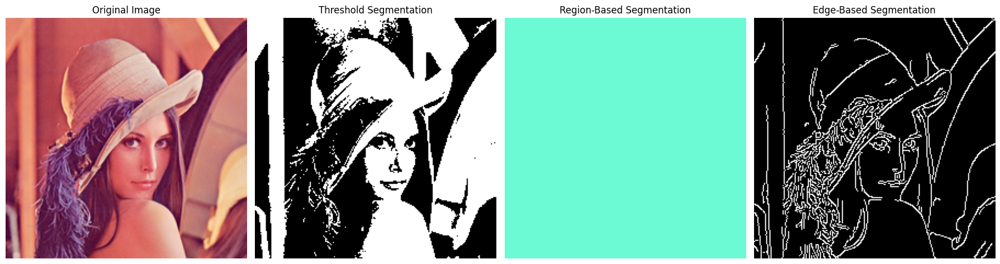

In [21]:
#Color Image Processing
import cv2
import numpy as np
import matplotlib.pyplot as plt

def threshold_segmentation(image, threshold):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    return binary_image

def region_based_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, markers = cv2.connectedComponents(gray)
    segmented_image = np.zeros_like(image)
    for i in range(1, markers.max() + 1):
        segmented_image[markers == i] = np.random.randint(0, 255, size=3)
    return segmented_image

def edge_based_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    return edges

image = cv2.imread("Lenna_(test_image).png")
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
threshold_result = threshold_segmentation(gray_image, 127)
region_result = region_based_segmentation(image)
edge_result = edge_based_segmentation(image)

plt.figure(figsize=(18, 12))
plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(threshold_result, cmap='gray')
plt.title("Threshold Segmentation")
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(region_result)
plt.title("Region-Based Segmentation")
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(edge_result, cmap='gray')
plt.title("Edge-Based Segmentation")
plt.axis('off')

plt.tight_layout()
plt.savefig("image_segmentation_output.png", dpi=300, bbox_inches='tight')
plt.show()


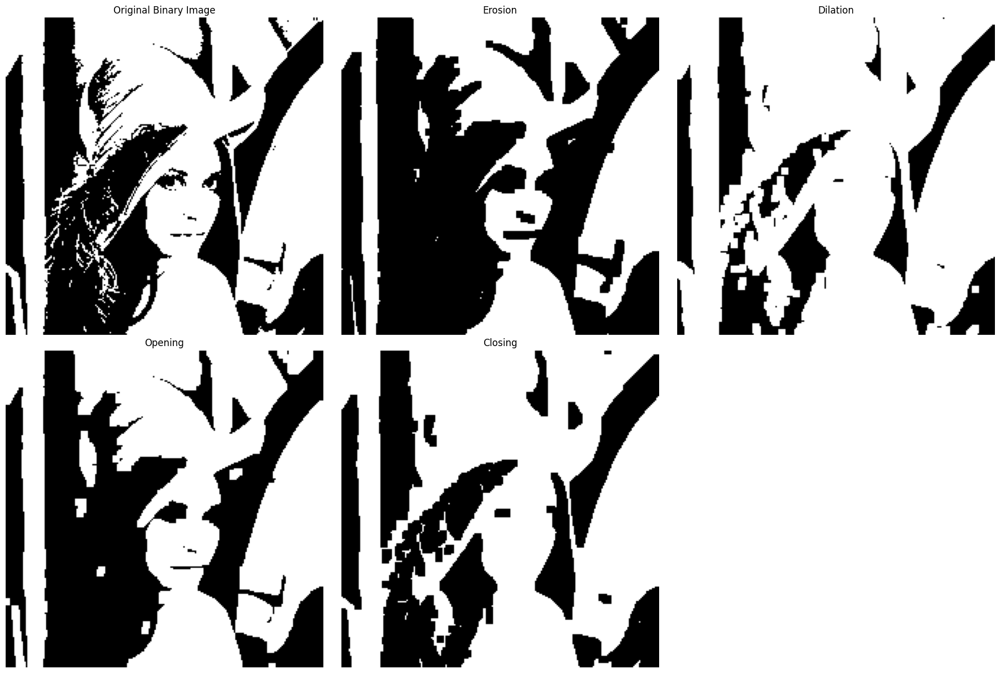

In [22]:
#Image Morphological Processing
import cv2
import numpy as np
import matplotlib.pyplot as plt

def perform_erosion(binary_image, kernel):
    return cv2.erode(binary_image, kernel, iterations=1)

def perform_dilation(binary_image, kernel):
    return cv2.dilate(binary_image, kernel, iterations=1)

def perform_opening(binary_image, kernel):
    return cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

def perform_closing(binary_image, kernel):
    return cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

image = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_GRAYSCALE)
if image is None:
    raise FileNotFoundError("Image not found. Ensure the path is correct.")

_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
kernel = np.ones((5, 5), np.uint8)

erosion_result = perform_erosion(binary_image, kernel)
dilation_result = perform_dilation(binary_image, kernel)
opening_result = perform_opening(binary_image, kernel)
closing_result = perform_closing(binary_image, kernel)

plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(binary_image, cmap='gray')
plt.title("Original Binary Image")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(erosion_result, cmap='gray')
plt.title("Erosion")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(dilation_result, cmap='gray')
plt.title("Dilation")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(opening_result, cmap='gray')
plt.title("Opening")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(closing_result, cmap='gray')
plt.title("Closing")
plt.axis('off')

plt.tight_layout()
plt.savefig("image_morphological_processing_output.png", dpi=300, bbox_inches='tight')
plt.show()


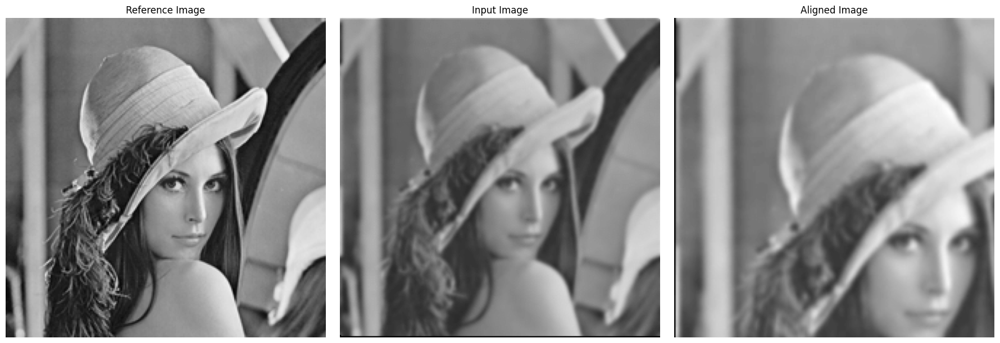

In [24]:
#Image Registration
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform as tf

def align_images(image1, image2):
    orb = cv2.ORB_create()
    keypoints1, descriptors1 = orb.detectAndCompute(image1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(image2, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    matches = sorted(matches, key=lambda x: x.distance)

    points1 = np.float32([keypoints1[m.queryIdx].pt for m in matches])
    points2 = np.float32([keypoints2[m.trainIdx].pt for m in matches])

    matrix, _ = cv2.estimateAffinePartial2D(points1, points2, method=cv2.RANSAC)
    aligned_image = cv2.warpAffine(image2, matrix, (image1.shape[1], image1.shape[0]))
    return aligned_image

image1 = cv2.imread("Lenna_(test_image).png", cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread("/content/lenna_altered.png", cv2.IMREAD_GRAYSCALE)
if image1 is None or image2 is None:
    raise FileNotFoundError("One or both images not found. Ensure the paths are correct.")

aligned_image = align_images(image1, image2)

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(image1, cmap='gray')
plt.title("Reference Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image2, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(aligned_image, cmap='gray')
plt.title("Aligned Image")
plt.axis('off')

plt.tight_layout()
plt.savefig("image_registration_output.png", dpi=300, bbox_inches='tight')
plt.show()